In [7]:

import re
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

def read_log(file_path):
    pattern = re.compile(r'\[(\d+)/\d+\]\s+Loss_D:\s+([-.\d]+)\s+Loss_G:\s+([-.\d]+),\s+Wasserstein_dist:([-.\d]+),\s+vae_loss_seen:([-.\d]+)\s+ZSL:\s+unseen\s+accuracy=([-.\d]+)')
    
    data = {
        'epoch': [],
        'Loss_D': [],
        'Loss_G': [],
        'Wasserstein_dist': [],
        'vae_loss_seen': [],
        'unseen_accuracy': []
    }
    
    with open(file_path, 'r') as file:
        for line in file:
            match = pattern.search(line)
            if match:
                data['epoch'].append(int(match.group(1)))
                data['Loss_D'].append(float(match.group(2)))
                data['Loss_G'].append(float(match.group(3)))
                data['Wasserstein_dist'].append(float(match.group(4)))
                data['vae_loss_seen'].append(float(match.group(5)))
                data['unseen_accuracy'].append(float(match.group(6)))
    
    return pd.DataFrame(data)

def plot_metrics(log_file_path):
    df = read_log(log_file_path)
    sns.set_theme(style="whitegrid")
    fig, axes = plt.subplots(2, 2, figsize=(14, 10))
    fig.suptitle(log_file_path, fontsize=16)

    # Loss_D and Loss_G in the same subplot
    sns.lineplot(ax=axes[0, 0], data=df, x='epoch', y='Loss_D',  label='Loss_D')
    sns.lineplot(ax=axes[0, 0], data=df, x='epoch', y='Loss_G', label='Loss_G', color='r')
    axes[0, 0].set_title('Loss_D and Loss_G Over Epochs')
    axes[0, 0].set_xlabel('Epoch')
    axes[0, 0].set_ylabel('Loss')
    axes[0, 0].legend()

    # Wasserstein Distance
    sns.lineplot(ax=axes[0, 1], data=df, x='epoch', y='Wasserstein_dist')
    axes[0, 1].set_title('Wasserstein Distance Over Epochs')
    axes[0, 1].set_xlabel('Epoch')
    axes[0, 1].set_ylabel('Wasserstein Distance')

    # VAE Loss Seen
    sns.lineplot(ax=axes[1, 0], data=df, x='epoch', y='vae_loss_seen')
    axes[1, 0].set_title('VAE Loss Seen Over Epochs')
    axes[1, 0].set_xlabel('Epoch')
    axes[1, 0].set_ylabel('VAE Loss Seen')

    # Unseen Accuracy
    sns.lineplot(ax=axes[1, 1], data=df, x='epoch', y='unseen_accuracy')
    axes[1, 1].set_title('Unseen Accuracy Over Epochs')
    axes[1, 1].set_xlabel('Epoch')
    axes[1, 1].set_ylabel('Unseen Accuracy')

    plt.tight_layout(rect=[0, 0, 1, 0.96])
    # plt.show()
    # 保存图片到img
    fig.savefig('img/' + log_file_path + '.png')

/usr/local/miniconda3/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/miniconda3/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/miniconda3/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/miniconda3/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf va

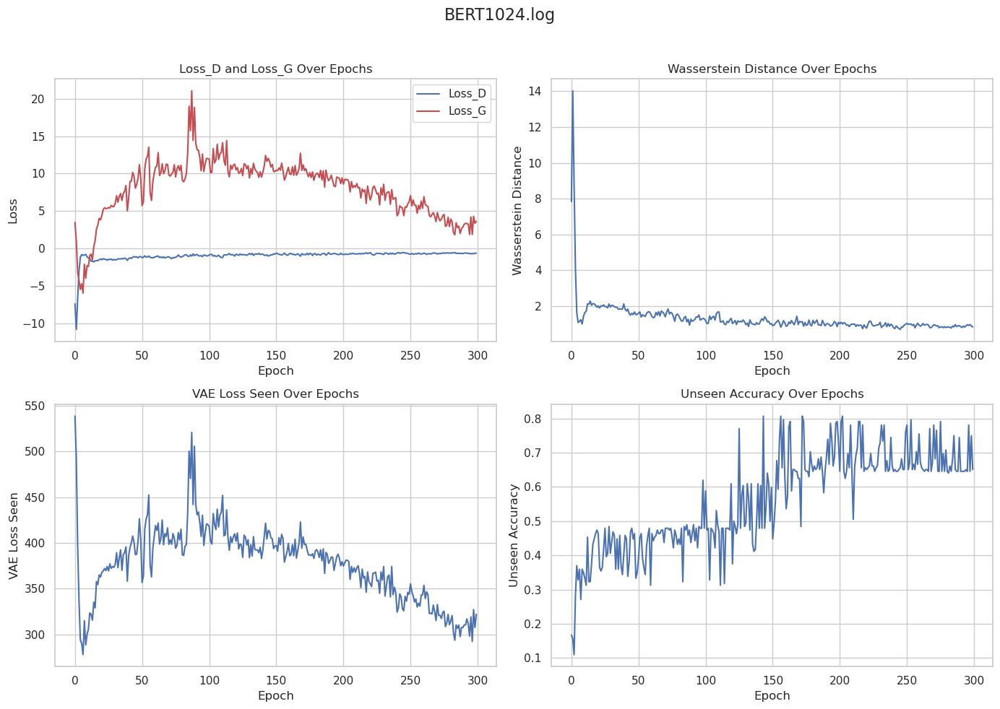

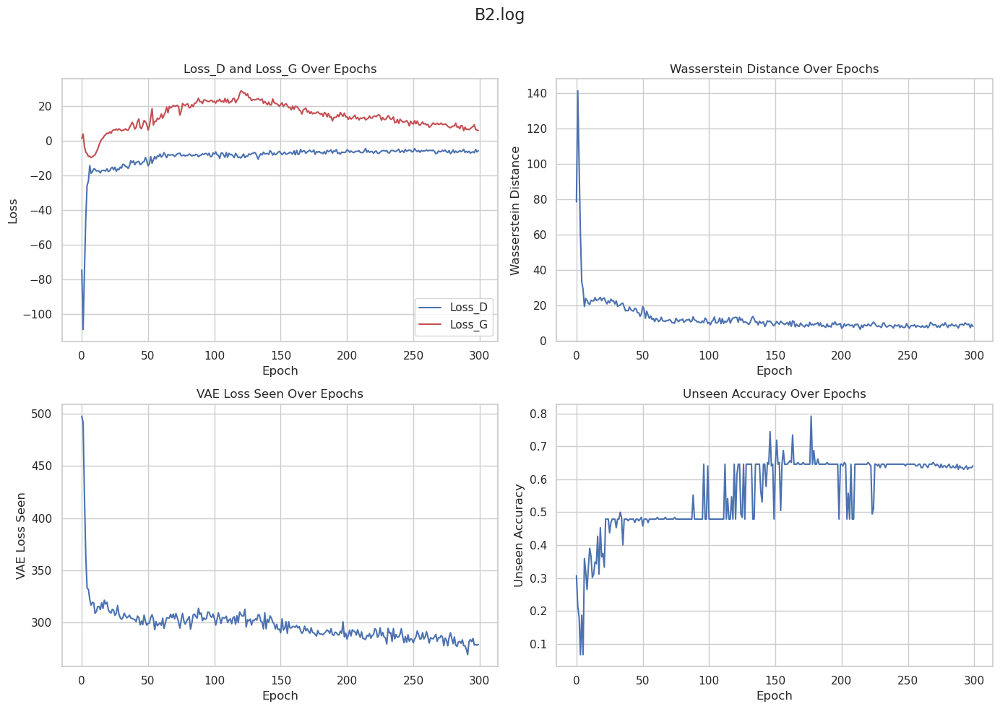

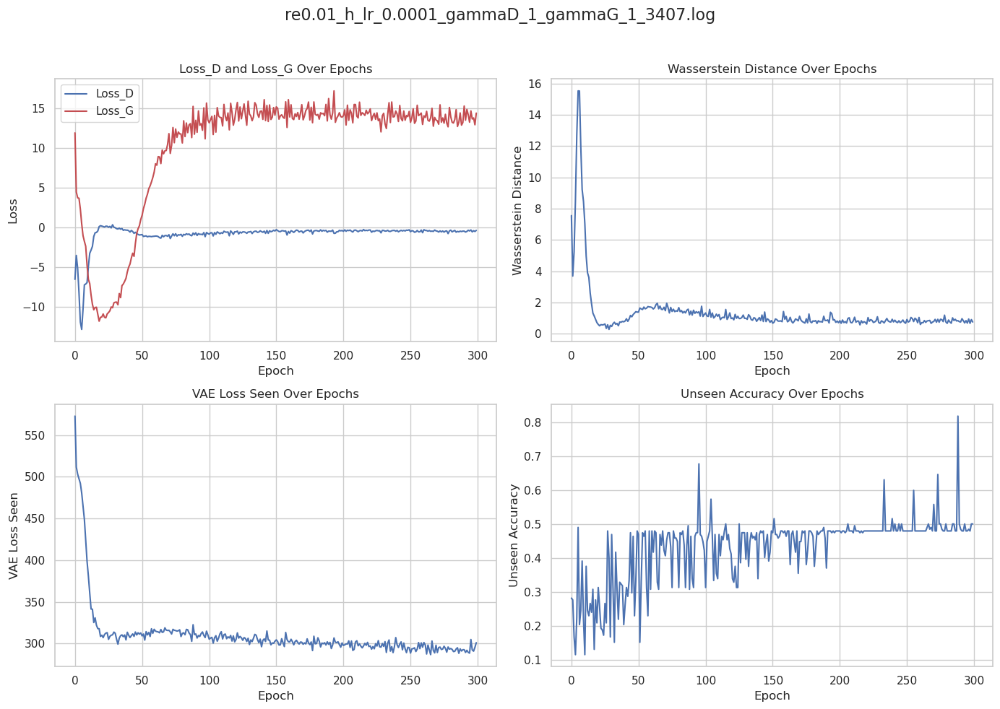

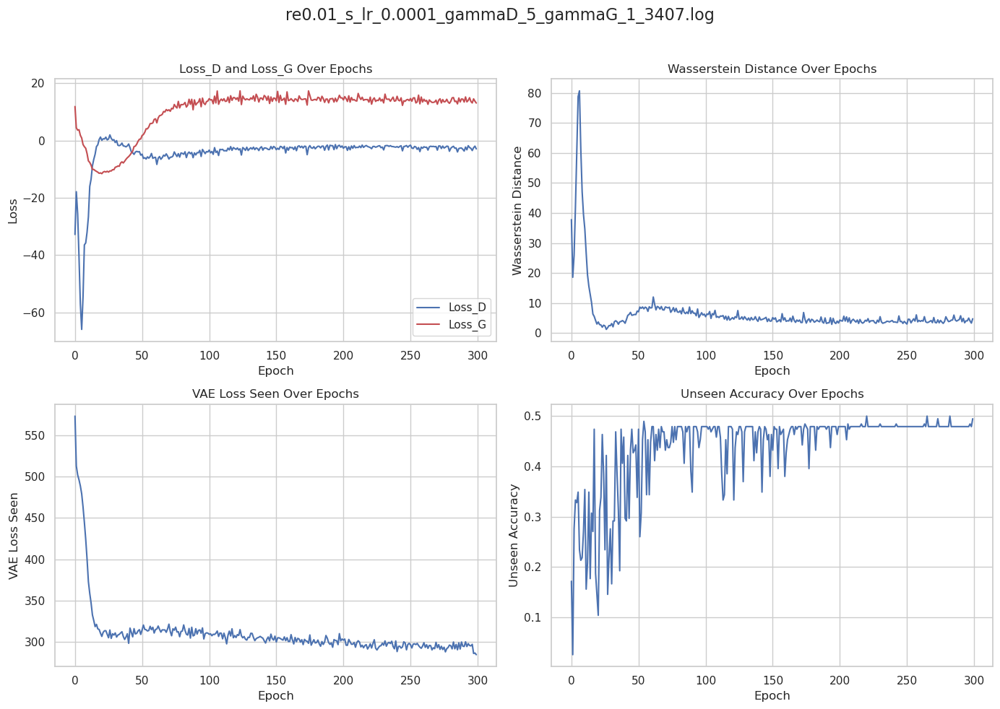

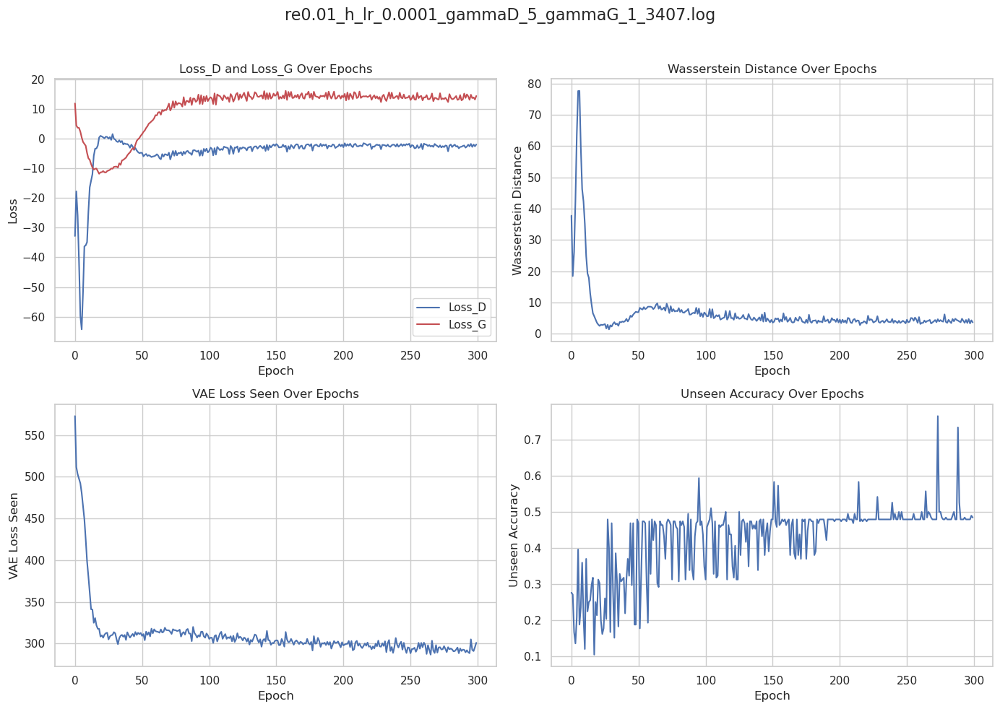

...

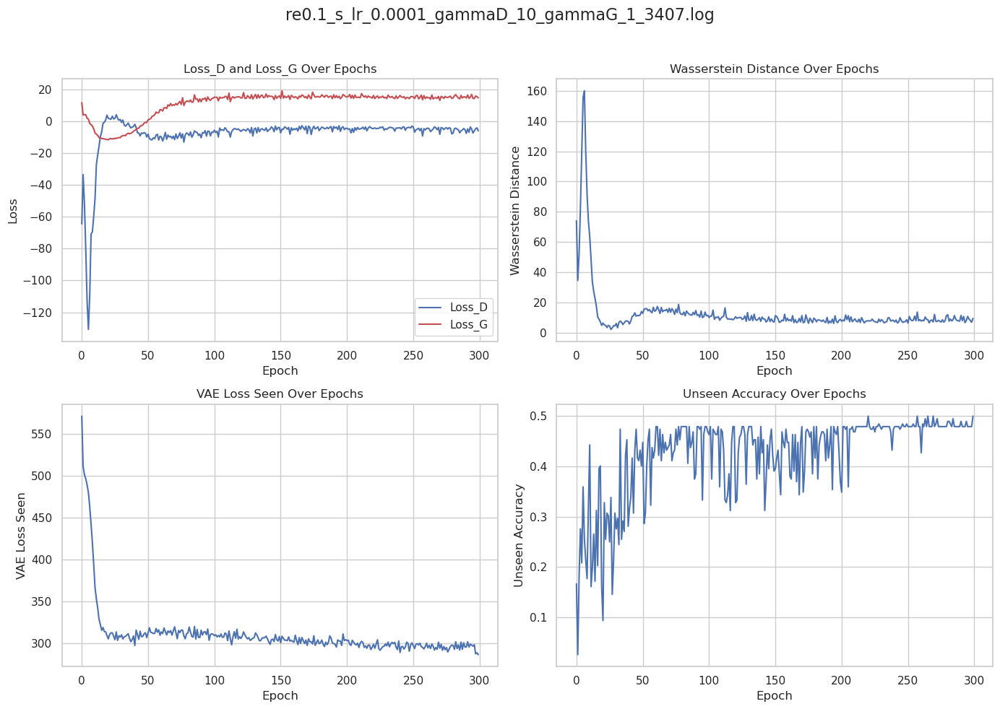

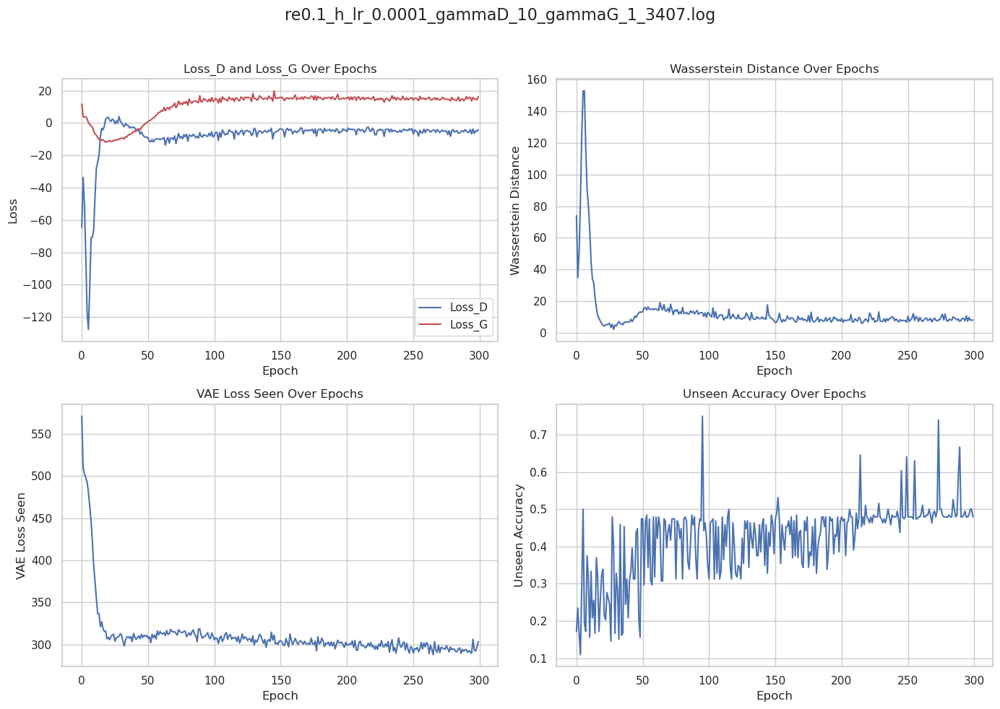

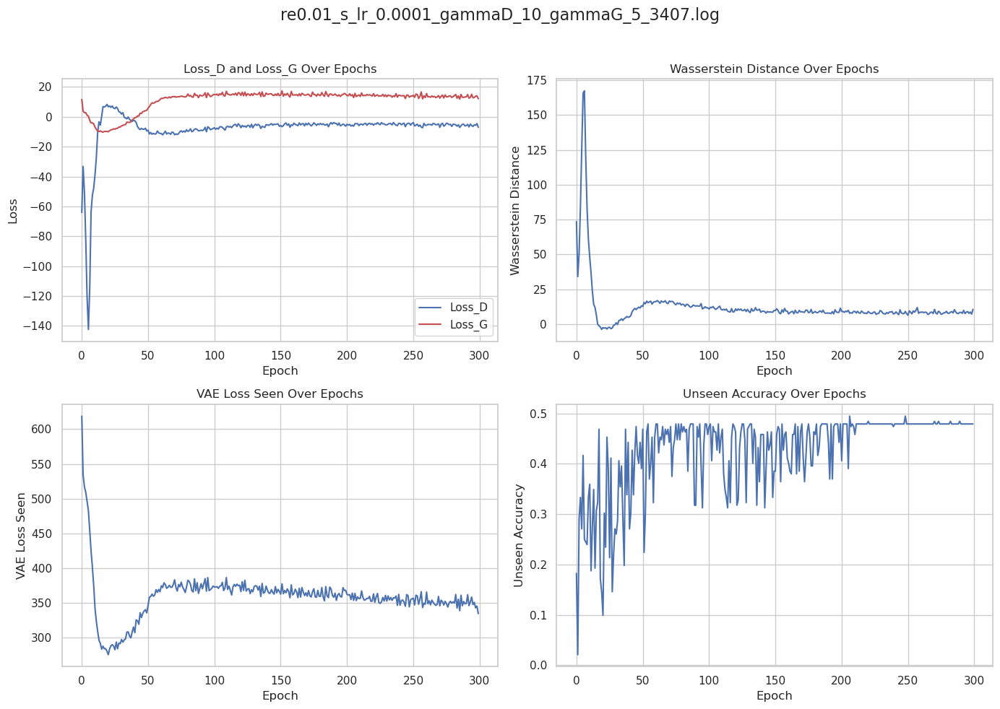

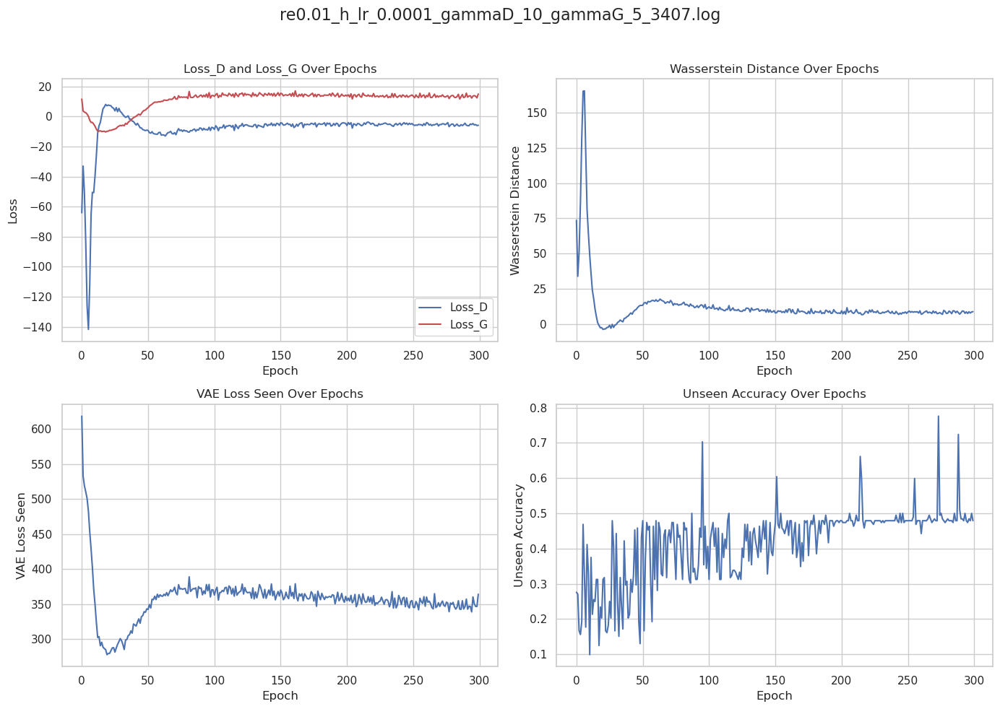

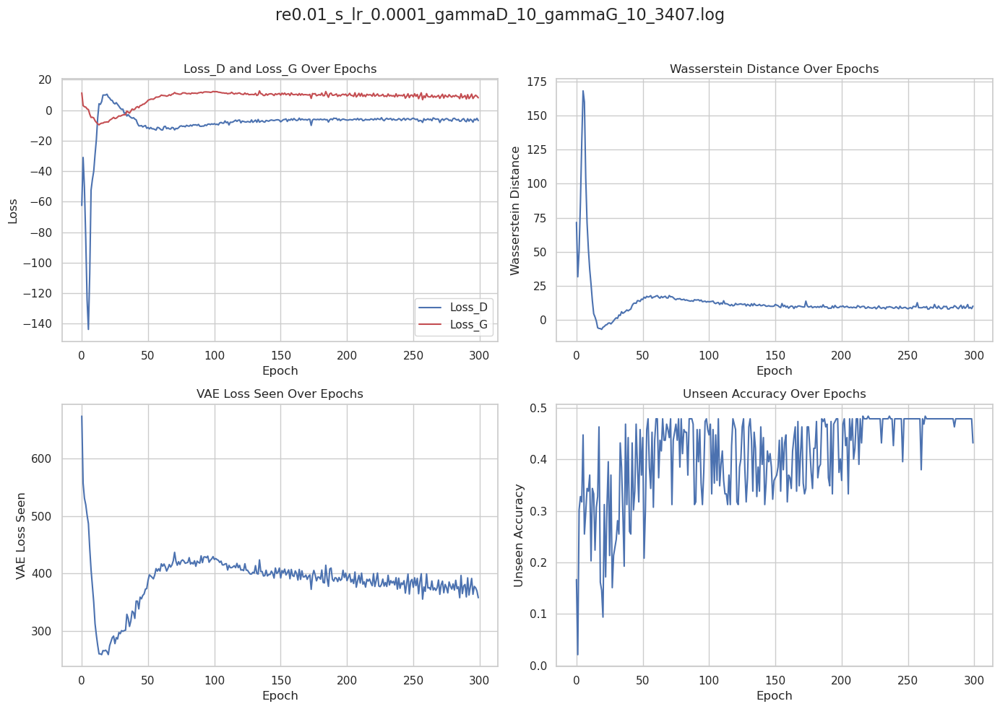

In [9]:
# 读取当前文件夹内所有的log文件
import os
for file in os.listdir():
    if file.endswith('.log'):
        # 如果同名图片存在于./img/中，则不再生成
        # if os.path.exists('img/' + file + '.png'):
        #     print('img/' + file + '.png exists, skip')
        # else:
            plot_metrics(file)
        